In [28]:
import mne
from mne.datasets import sample
from mne import io
from mne.preprocessing import create_ecg_epochs, create_eog_epochs
from mne.preprocessing import ICA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import autoreject
from autoreject import *


In [29]:
ROOT = '/home/dcellier/RDSS/CMI_data/MIPDB/EEGData/'
raw_file=ROOT+"A00051955/EEG/raw/raw_format/A00051955001.raw"
raw=mne.io.read_raw_egi(raw_file,montage=mne.channels.read_montage(kind='GSN-HydroCel-128'),preload=True, verbose=True)
#raw2=mne.io.read_raw_egi(raw_file,montage=mne.channels.read_montage(kind='GSN-HydroCel-128'),preload=True, verbose=True)

Reading EGI header from /home/dcellier/RDSS/CMI_data/MIPDB/EEGData/A00051955/EEG/raw/raw_format/A00051955001.raw...
    Reading events ...
    Assembling measurement info ...
    Synthesizing trigger channel "STI 014" ...
    Excluding events {0   , 11  , 12  , 13  , 14  , 15  , 16  , 17  , 18  , 21  , 22  , 23  , 24  , 25  , 26  , 27  , 28  , 31  , 32  , 33  , 34  , 35  , 4   , 5   , 50  , 8   , 81  , 82  , 83  , 84  , 86  , 9   , 90  , 91  , 92  , 93  , 94  , 95  , 96  , 97  } ...
Reading 0 ... 181499  =      0.000 ...   362.998 secs...


<ipython-input-29-67bbfbe44307>:3: RuntimeWarning: The following EEG sensors did not have a position specified in the selected montage: ['E129']. Their position has been left untouched.
  raw=mne.io.read_raw_egi(raw_file,montage=mne.channels.read_montage(kind='GSN-HydroCel-128'),preload=True, verbose=True)


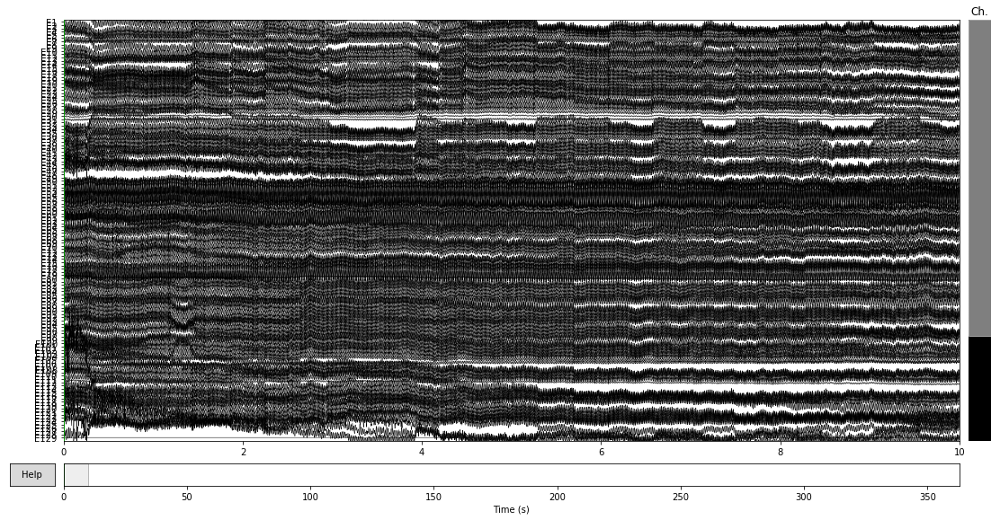

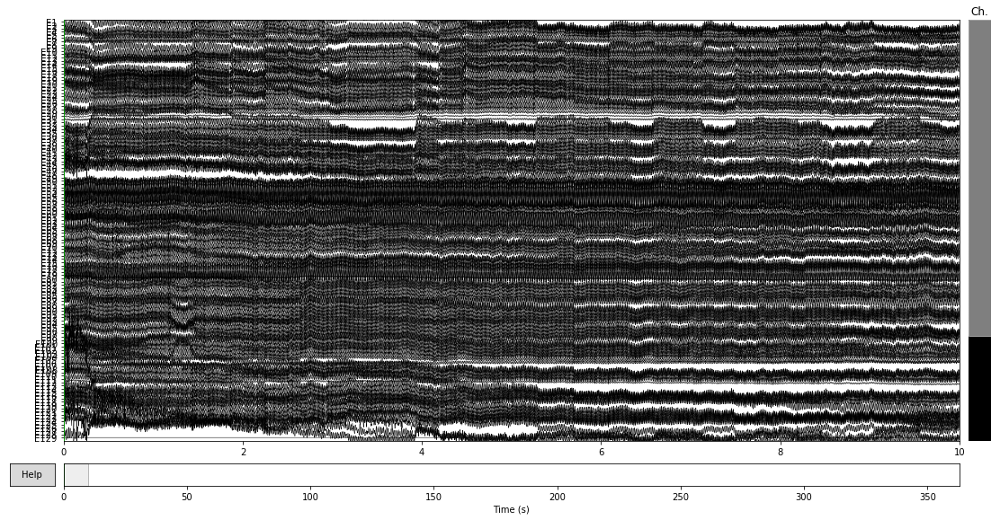

In [30]:
raw.plot(n_channels=129,group_by='original')


In [81]:
#raw.info['chs'][44:129]
dataChannels = ['E2','E3','E4','E5','E6','E7','E9','E10','E11','E12',
    'E13','E15','E16','E18','E19','E20','E22','E23','E24','E26',
    'E27','E28','E29','E30','E31','E33','E34','E35','E36','E37',
    'E39','E40','E41','E42','E45','E46','E47','E50','E51','E52','E53','E54','E55','E58','E59','E60','E61',
    'E62','E65','E66','E67','E70','E71','E72','E75','E76','E77','E78','E79','E80','E83','E84',
    'E85','E86','E87','E90','E91','E92','E93','E96','E97','E98','E101','E102','E103','E104',
    'E105','E106','E108','E109','E110','E111','E112','E115','E116','E117','E118','E122','E123','E124']
#this is the list of 'real' channels that Justin sent, all others are external electrodes
extChannels = [e['ch_name'] for e in raw.info['chs'] if ((e['ch_name'] not in dataChannels) and (e in raw.info['chs'][:129]))]
extChannels
randChannels=[e for e in raw.info['ch_names'] if ((e not in dataChannels) and (e not in extChannels))]
#stimChannels=raw.get_data[raw.info['ch_names'].index('STI 014')]
raw_stimCH=raw.copy() #making a copy that retains its stim channels for finding events later
raw=raw.drop_channels(randChannels)
#raw.info['bads']=['E2']

# Cutting and concatenating raw file into eyes open/eyes closed conditions

In [32]:
events = mne.find_events(raw_stimCH, verbose=True)
print(events)
raw.info['events']=events # i think that 1=EO and 2=EC

11 events found
Event IDs: [1 2]
[[ 29246      0      1]
 [ 39245      0      2]
 [ 59244      0      1]
 [ 69244      0      2]
 [ 89244      0      1]
 [ 99244      0      2]
 [119243      0      1]
 [129243      0      2]
 [149242      0      1]
 [159242      0      2]
 [179246      0      1]]


In [33]:
####### Indexing ##########

eyes_open_idx=[]
eyes_closed_idx=[]
for event in events:
    if event[2]==1:
        eyes_open_idx.append(event[0])
    elif event[2]==2:
        eyes_closed_idx.append(event[0])
print(eyes_open_idx)
print(eyes_closed_idx)

#grabbing out slices of eyes open to later concatenate together, minus first 3 secs of data
sec2concat=[]
for idx in eyes_open_idx[:-1]: #excluding last eyes open event because it doesn't seem to have lasted the whole 20secs
    time=raw.times[idx]
    eoEvent=raw.copy().crop((time+3),(time+20))
    sec2concat.append(eoEvent)

sec2concat[0].append(sec2concat[1:])
eyes_open_raw=sec2concat[0]
print(eyes_open_raw)

#grabbing out slices of eyes closed to later concatenate together, minus first 3 secs of data
sec2concat=[]
for idx in eyes_closed_idx: 
    time=raw.times[idx]
    ecEvent=raw.copy().crop((time+3),(time+40))
    sec2concat.append(ecEvent)

sec2concat[0].append(sec2concat[1:])
eyes_closed_raw=sec2concat[0]
print(eyes_closed_raw)

#eyes_open=mne.Epochs(raw_fiir,events=events,event_id={'eyes open':1},tmin=0,tmax=20,baseline=None,decim=2,picks=our_picks)
# no baseline correction here
# downsampled by factor of 2
# I cut out the first couple of seconds of data for if the event trigger is being sent when they are hearing instructions?
#eyes_closed=mne.Epochs(raw_fiir,events=events,event_id={'eyes closed':2},tmin=3,tmax=40,decim=2,baseline=None,picks=our_picks)
#eyes_closed.plot() #is this really the eyes closed data?? Seems very noisy

[29246, 59244, 89244, 119243, 149242, 179246]
[39245, 69244, 99244, 129243, 159242]
<RawEGI  |  A00051955001.raw, n_channels x n_times : 129 x 42505 (85.0 sec), ~42.2 MB, data loaded>
<RawEGI  |  A00051955001.raw, n_channels x n_times : 129 x 92505 (185.0 sec), ~91.4 MB, data loaded>


Effective window size : 4.096 (s)


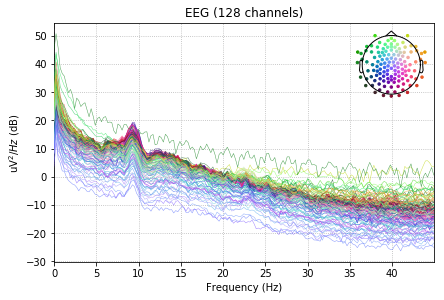

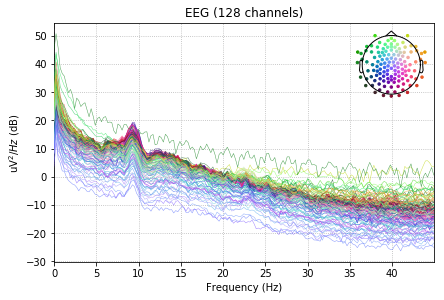

In [80]:
eyes_closed_raw.plot_psd(fmax=45,picks=mne.pick_types(raw_fi.info,meg=False,eeg=True,eog=False,exclude=['E129'])) #sanity check
#eyes_closed.plot()

# Applying high and low pass filters (1 and 50)

Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected


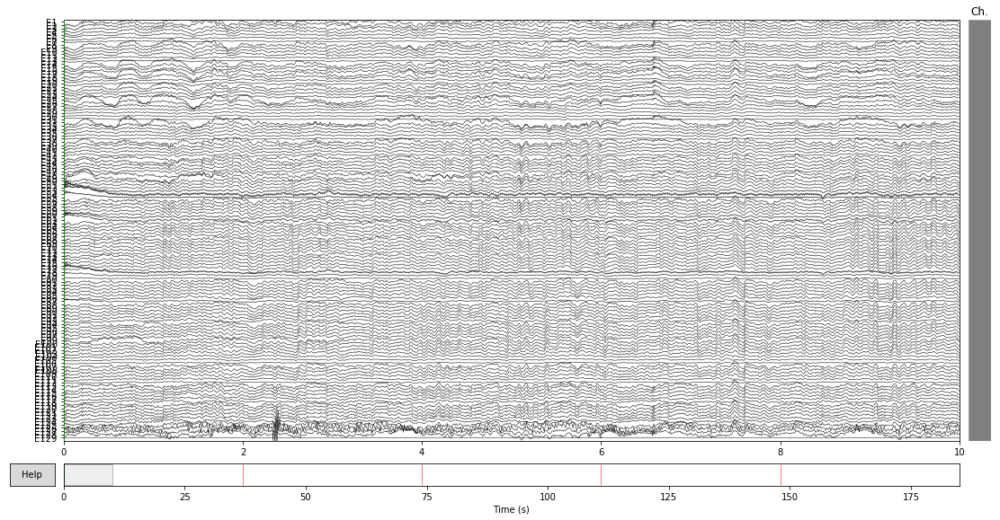

Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected
Setting up band-pass filter from 1 - 50 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 12.5 Hz
Filter length of 1651 samples (3.302 sec) selected


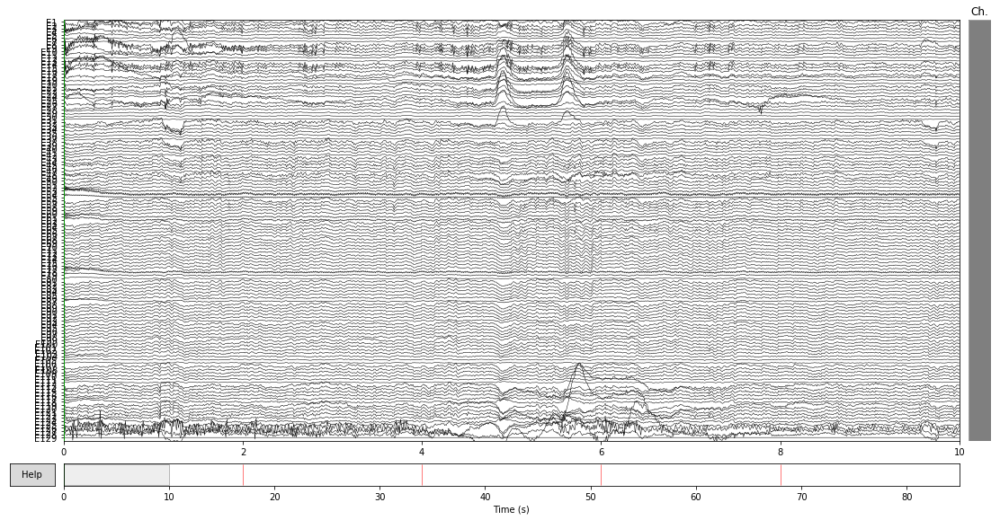

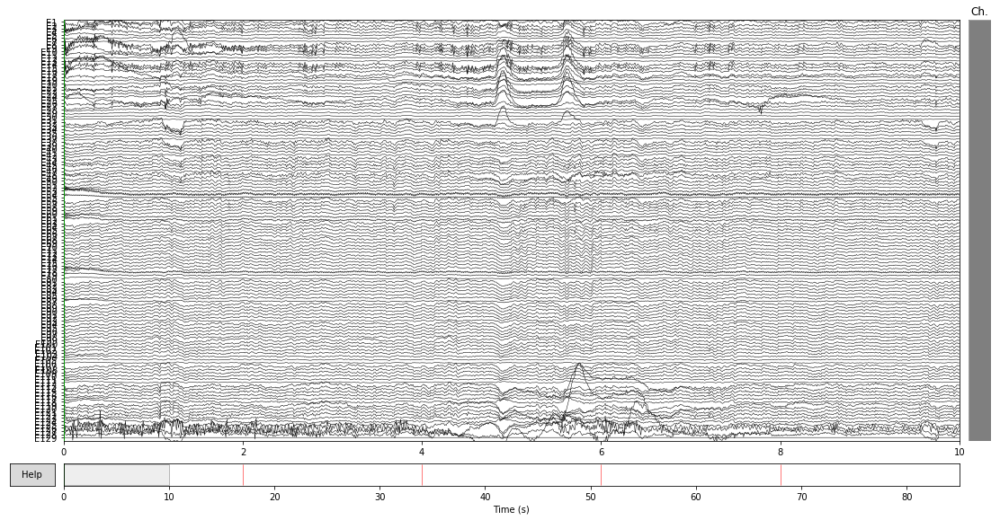

In [35]:
EC_f=eyes_closed_raw.copy()
EC_f.filter(1,50)
    #can choose different methods of filtering. here it's using the default 'overlap-add' FIR filtering, can
        # also use IIR forward/backward filtering
EC_f.plot(n_channels=129)#n_channels=129,group_by='original')

EO_f=eyes_open_raw.copy()
EO_f.filter(1,50)
EO_f.plot(n_channels=129)#n_channels=129,group_by='original')

# Select bad electrodes from "real" data to interpolate

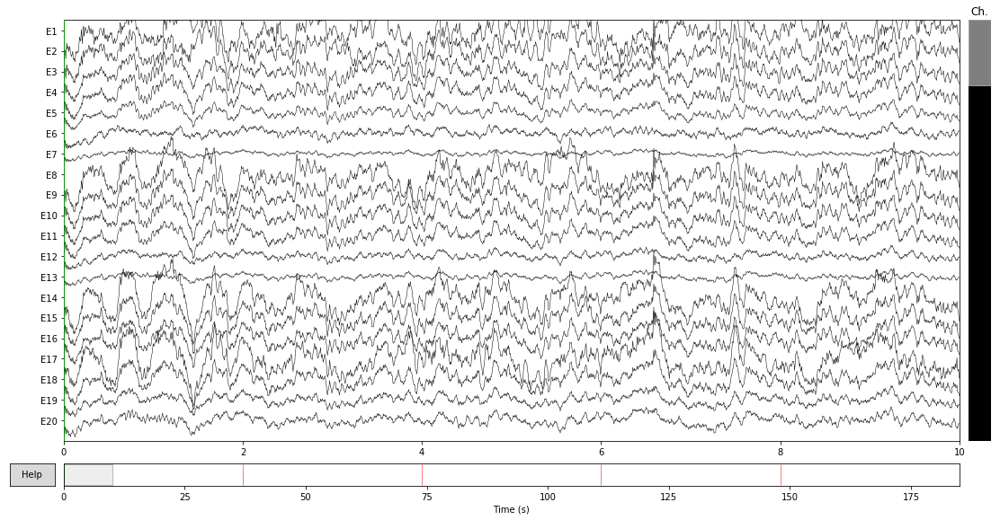

[]


<ipython-input-84-4549850d0be0>:4: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  EC_fi=EC_fi.interpolate_bads()


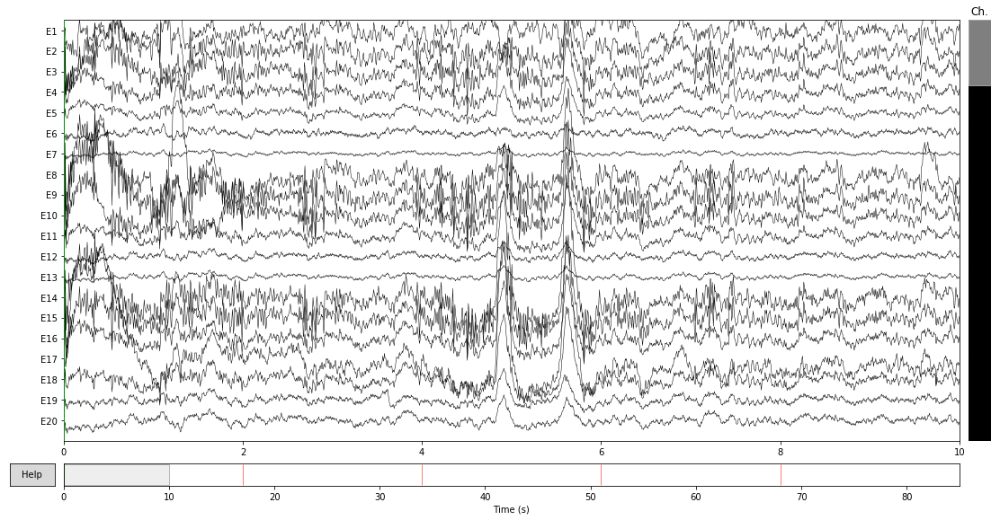

[]


<ipython-input-84-4549850d0be0>:9: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  EO_fi=EO_fi.interpolate_bads()


In [84]:
EC_fi=EC_f.copy()
EC_fi.plot(block=True) #pauses script while i visually inspect data and select which channels to delete
print(EC_fi.info['bads'])
EC_fi=EC_fi.interpolate_bads()

EO_fi=EO_f.copy()
EO_fi.plot(block=True) 
print(EO_fi.info['bads'])
EO_fi=EO_fi.interpolate_bads()

# # https://github.com/mne-tools/mne-python/blob/master/mne/preprocessing/bads.py automatic detection of bads 
   # uses z-scoring

# Importing Montage

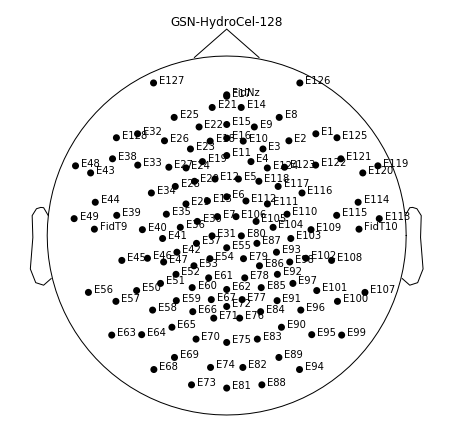

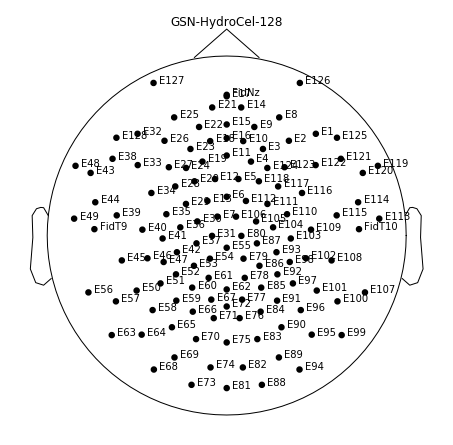

In [37]:
layout=mne.channels.read_montage(kind='GSN-HydroCel-128')
layout.plot() 

In [41]:
our_picks=mne.pick_types(EC_fi.info,meg=False,eeg=True,eog=False)
EC_fi=EC_fi.set_montage(layout)

<ipython-input-41-e6ffc2c2170d>:2: RuntimeWarning: The following EEG sensors did not have a position specified in the selected montage: ['E129']. Their position has been left untouched.
  EC_fi=EC_fi.set_montage(layout)


# Re-referencing using global avg referencing

Applying a custom EEG reference.


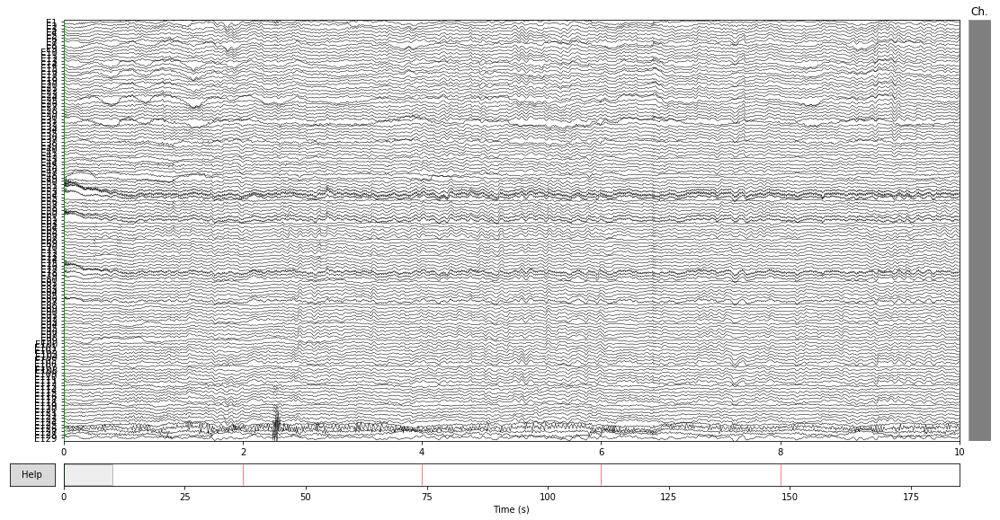

Applying a custom EEG reference.


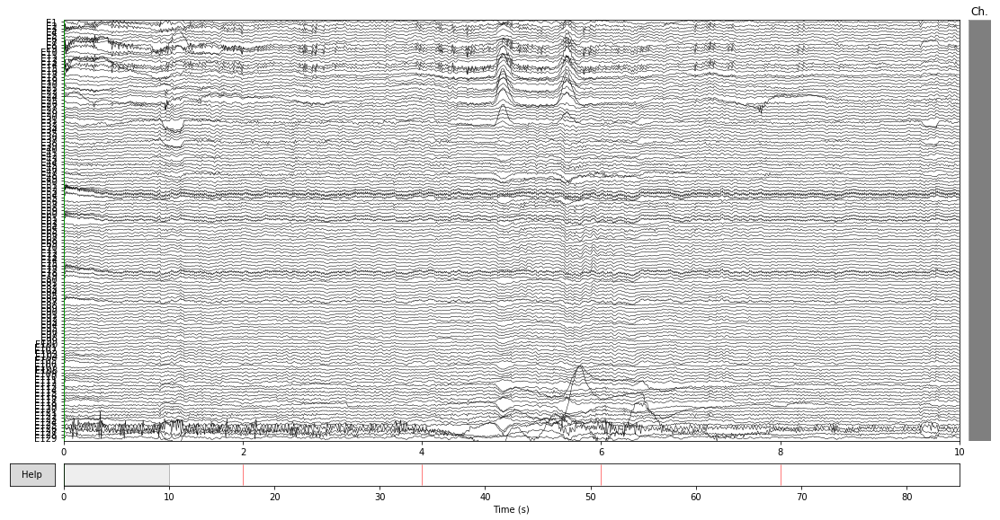

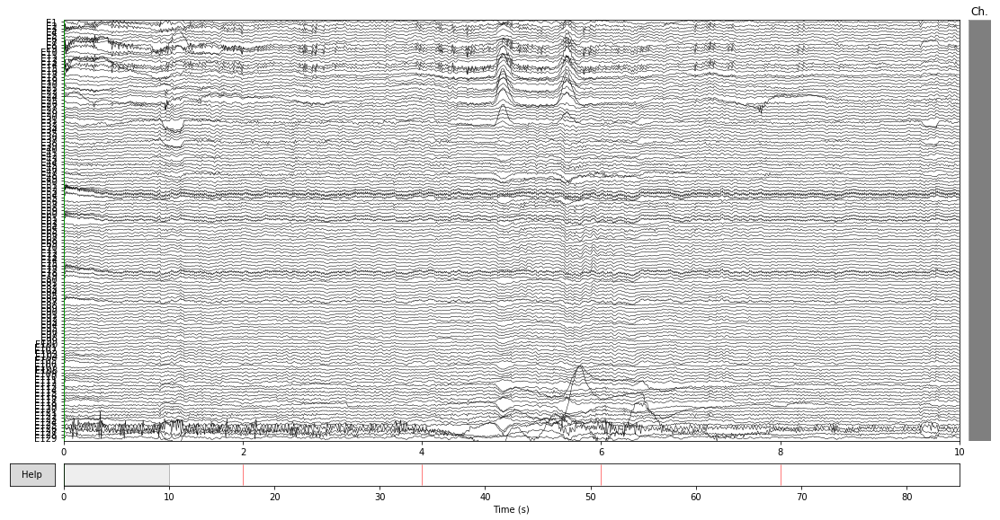

In [42]:
# SHOULD THIS COME BEFORE ICA? see manuscript blurb
## ?? should we use all scalp electrodes too? not truly global until use all electrodes
EC_fir, r2 = mne.set_eeg_reference(EC_fi,ref_channels=extChannels) 
EC_fir.plot(n_channels=129)
EO_fir, r2 = mne.set_eeg_reference(EO_fi,ref_channels=extChannels) 
EO_fir.plot(n_channels=129)

# ICA

In [55]:
## fitting IC's

datasets=[EC_fir,EO_fir]
ica_data={}

for data in datasets:
    ica = []
    ica = ICA(n_components=128,random_state=25)
    ica.fit(data,picks=our_picks)
    #ica.info

    eog_ic=[]
    for ch in []: #insert EOG channels
        eog_idx,scores=ica.find_bads_eog(data,ch_name=ch)
        eog_ic.append(eog_idx)

    print(eog_ic)

    ecg_ic=[]
    for ch in []: # insert ECG channels
        ecg_idx,scores=ica.find_bads_ecg(data,ch_name=ch)
        ecg_ic.append(ecg_idx)

    print(ecg_ic)

    reject_ic=[]
    for eog_inds in eog_ic:
        for ele in eog_inds:
            if ele not in reject_ic:
                reject_ic.append(ele)
    for ecg_inds in ecg_ic:
        for ele in ecg_inds:
            if el not in reject_ic:
                reject_ic.append(el)
    
    print(reject_ic)                

    ica.exclude=[]
    ica.exclude.extend(reject_ic) #which IC's to exclude

    #ica.exclude #excluding the eog/ecg ic's
    if data==EC_fir:
        name='EC'
    else:
        name='EO'
    ica_data[name]=(ica,data)

Fitting ICA to data using 129 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selection by number: 128 components
Fitting ICA took 20.8s.
[]
[]
[]
Fitting ICA to data using 129 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selection by number: 128 components
Fitting ICA took 9.8s.
[]
[]
[]


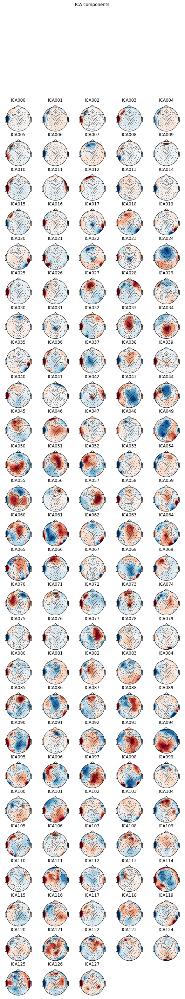

[]


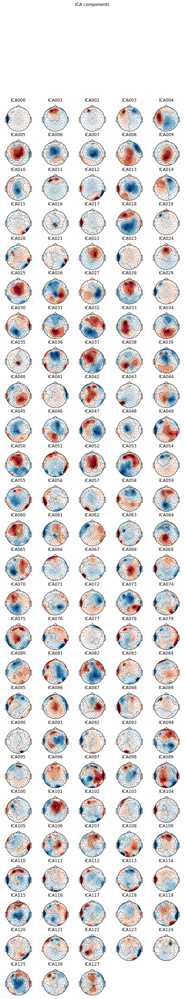

[]
Transforming to ICA space (128 components)
Zeroing out 0 ICA components
Transforming to ICA space (128 components)
Zeroing out 0 ICA components
Transforming to ICA space (128 components)
Zeroing out 0 ICA components


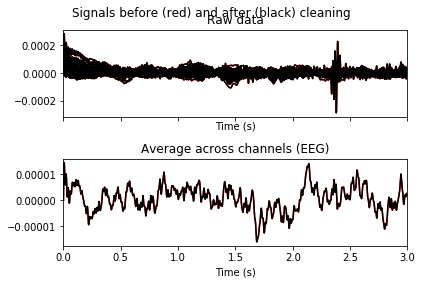

Transforming to ICA space (128 components)
Zeroing out 0 ICA components


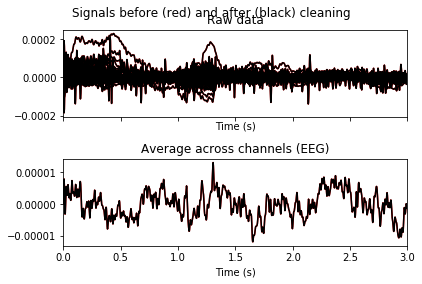

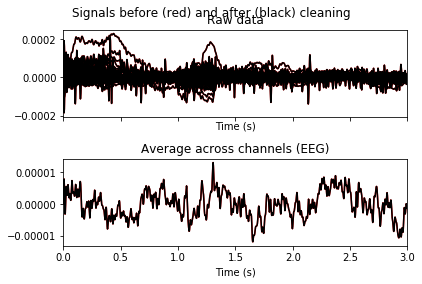

In [56]:
for icDat in ica_data.keys():
    ica=ica_data[icDat][0]
    data=ica_data[icDat][1]
    ica.plot_components(picks=range(128),ch_type='eeg',inst=data) #needs the channel locations

### ask for user input here ###
    bad_ics=[] #whichever ic's are identified by visual inspection
    eogecg_ics=[] # enter which ic's identified by the auto functions you want to actually keep, if any
    ica.exclude.extend(bad_ics)
    #ica.exclude.delete(eogecg_ics) ???
    print(ica.exclude)
    ica_data[icDat]=(ica,data)

EC_firi=EC_fir

EC_firi=(ica_data['EC'][0]).apply(EC_firi)
EO_firi=EO_fir
EO_firi=ica_data['EO'][0].apply(EO_firi)
#raw_fii.plot()

ica_data['EC'][0].plot_overlay(EC_fir,ica_data['EC'][0].exclude,picks=our_picks_EC)
ica_data['EO'][0].plot_overlay(EO_fir,ica_data['EO'][0].exclude,picks=our_picks_EO)

# Epoching into 2 second, non overlapping time windows

In [57]:
eyes_closed=EC_firi
eyes_open=EO_firi

In [109]:
epoch_array=[]
for t in eyes_closed.times[0::1000]: #grabbing sample # (index) of ea 2 second data point
    epoch_array.append([int(list(eyes_closed.times).index(t)),int(0),int(7)])  

In [106]:
#ec_cop=eyes_closed.add_channels(['STI 014'])


AttributeError: 'str' object has no attribute 'preload'

In [93]:
#epoch_array # cutting into two second time windows
#mne.write_events(ROOT+'test-eve.fif',np.asarray(epoch_array))

In [112]:
eyes_closed.info['events']=np.asarray(epoch_array)


In [89]:
realData=mne.pick_types(raw.info,meg=False,eeg=True,eog=False,exclude=extChannels+randChannels,selection=dataChannels)

In [90]:
# SHOULD I DOWNSAMPLE, REJECTION PARAMS??
twoSec_EC_epoch=mne.Epochs(eyes_closed,events=epoch_array,tmin=0,tmax=2,event_id={'twoSec':7},picks=realData)#,reject={'eeg':40e-6},flat={'eeg'=?}) #have to change this so it's not blurring over the eyes closed and eyes open

93 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated


In [ ]:
twoSec_EC_epoch.info

In [64]:
epoch_array_EO=[]
for t in eyes_open.times[0::1000]: #grabbing sample # (index) of ea 2 second data point
    epoch_array_EO.append([int(list(eyes_open.times).index(t)),int(0),int(7)])  
eyes_open.info['events']=epoch_array_EO
twoSec_EO_epoch=mne.Epochs(eyes_open,events=epoch_array_EO,tmin=0,tmax=2,event_id={'twoSec':7},picks=realData)#,reject={'eeg':40e-6},flat={'eeg'=?})

43 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated


In [65]:
#twoSec_EO_epoch.plot(block=True)
#twoSec_EC_epoch.plot(block=True) # need to manually select the epochs to discard

In [66]:
#Reject bad epochs
#twoSec_EO_epoch.drop_bad()
#twoSec_EC_epoch.drop_bad()

In [67]:
avg_EC=twoSec_EC_epoch.average()
#avg_EC.plot()
avg_EO=twoSec_EO_epoch.average()
#avg_EO.plot()

# automatic selection of epochs to reject

In [68]:
reject= get_rejection_threshold(twoSec_EC_epoch)
reject

Loading data for 93 events and 1001 original time points ...
43 bad epochs dropped
Estimating rejection dictionary for eeg


{'eeg': 0.000155327582837496}

In [79]:
twoSec_EC_epoch.load_data()
ar=AutoReject()
ar.fit(twoSec_EC_epoch)
ar.reject_log()

Running autoreject on ch_type=eeg
[........................................] 100.00% Creating augmented epochs - Computing thresholds ...
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    3.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    4.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    5.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    6.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    6.7s r

AttributeError: 'AutoReject' object has no attribute 'reject_log'

In [70]:
ECep_clean=ar.transform(twoSec_EC_epoch)
EC_avg=ECep_clean.average()


[........................................] 100.00% Repairing epochs -   Dropped 1 epoch


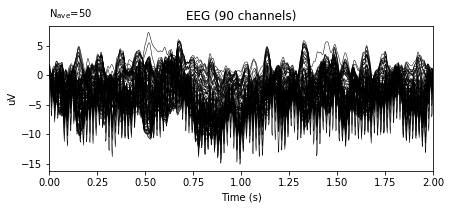

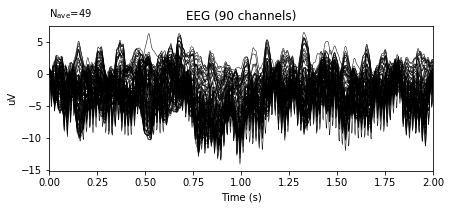

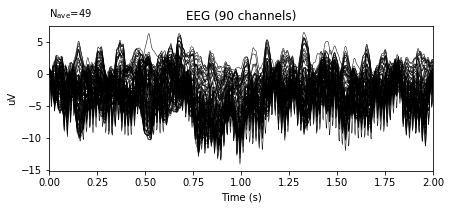

In [72]:
#set_matplotlib_defaults(plt)

#fig, axes = plt.subplots(2, 1, figsize=(6, 6))

#for ax in axes:
 #   ax.tick_params(axis='x', which='both', bottom='off', top='off')
  #  ax.tick_params(axis='y', which='both', left='off', right='off')

ylim = range(1,300)
avg_EC.pick_types(meg=False,eeg=True,eog=False,exclude=extChannels+randChannels,selection=dataChannels)
avg_EC.plot(exclude=[], ylim=ylim, show=False)
#axes[0].set_title('Before autoreject')
EC_avg.pick_types(meg=False,eeg=True,eog=False,exclude=extChannels+randChannels,selection=dataChannels)
EC_avg.plot(exclude=[], ylim=ylim)
#axes[1].set_title('After autoreject')
#plt.tight_layout()

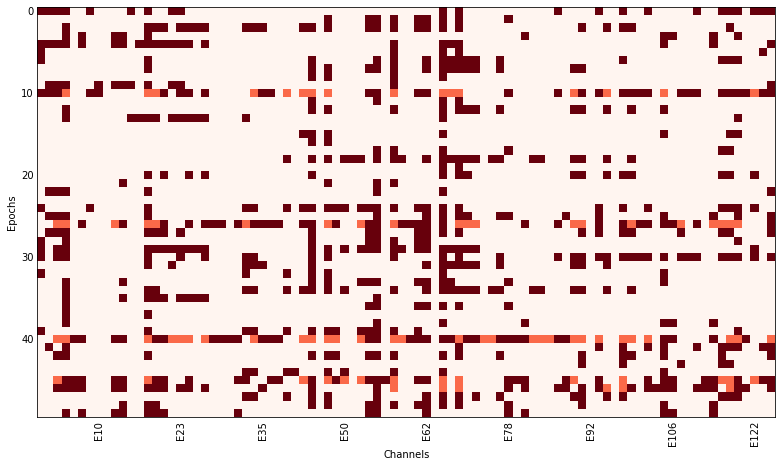

In [75]:
ar.get_reject_log(twoSec_EC_epoch).plot()
#ar.get_reject_log(twoSec_EO_epoch).plot()

In [113]:
sub='A00051955'
twoSec_EC_epoch.save(ROOT+sub+'/EEG/preproc/'+sub+'_epoch_eyesClosed_epo.fif')


Loading data for 1 events and 1001 original time points ...


AttributeError: 'numpy.ndarray' object has no attribute 'get'

In [119]:
import pickle

def save_object(obj,filename):
    with open(filename,'wb') as output:
        pickle.dump(obj,output,pickle.HIGHEST_PROTOCOL)

save_object(twoSec_EC_epoch,filename=ROOT+sub+'/EEG/preproc/'+sub+'_epoch_eyesClosed')

In [120]:
def read_object(filename):

                ''' short hand for reading object because I can never remember pickle syntax'''

                o = pickle.load(open(filename, "rb"))     

                return o
a=read_object(ROOT+sub+'/EEG/preproc/'+sub+'_epoch_eyesClosed')

Loading data for 20 events and 1001 original time points ...


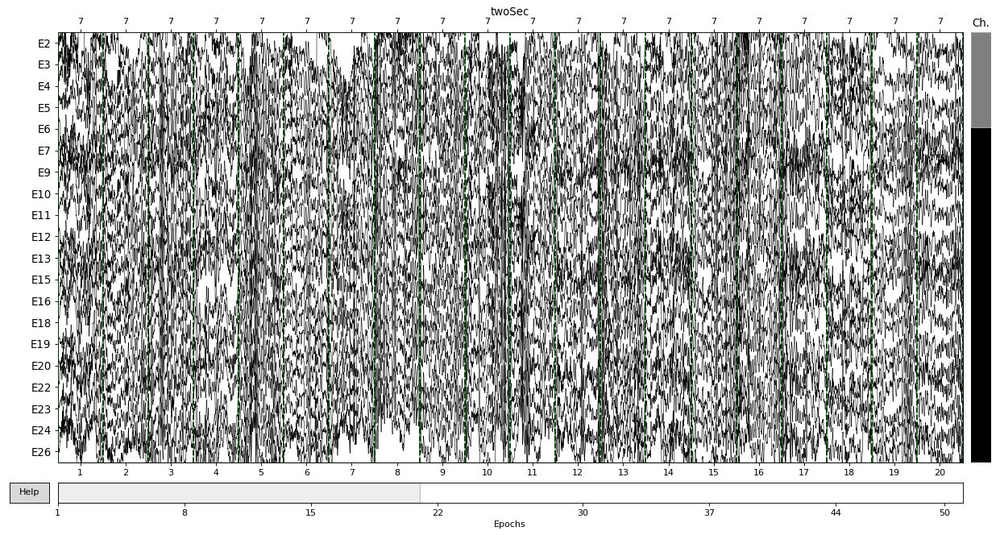

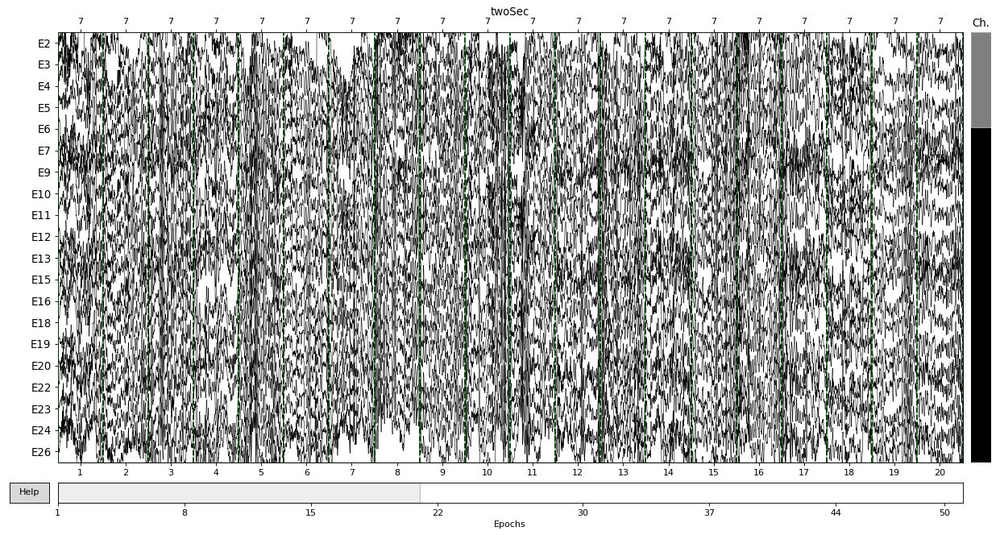

In [122]:
a.plot()
